# **Human Activity Recognition in Videos using CNN and LSTM**

**Installing the require libraries**

In [ ]:
# Donot display the output of this cell.
%%capture

# Install the required libraries.
!pip install youtube-dl moviepy
!pip install git+https://github.com/TahaAnwar/pafy.git#egg=pafy
!pip install -q moviepy
!apt install imagemagick
!pip install imageio==2.4.1

**Importing the required libraries**

In [ ]:
# Import the required libraries.
#Libraries to perform basic functions
import os
import cv2
import pafy
import math
import random

#Libraries to perform basic operations on dataset
import numpy as np
import datetime as dt
import tensorflow as tf
import matplotlib.pyplot as plt

from collections import deque

from moviepy.editor import *
%matplotlib inline

#Library to split the train and test dataset
from sklearn.model_selection import train_test_split

#Libraries to build,train and test the model
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)1916928/45929032 bytes (4.2%)4513792/45929032 bytes (9.8%)7323648/45929032 bytes (15.9%)9682944/45929032 bytes (21.1%)12279808/45929032 bytes (26.7%)14639104/45929032 bytes (31.9%)17457152/45929032 bytes (38.0%)19316736/45929032 bytes (42.1%)20848640/45929032 bytes (45.4%)23519232/45929032 bytes (51.2%)26681344/45929032 bytes (58.1%)28934144/45929032 bytes (63.0%)310

In [ ]:
## Done to reduce the degree of randomness in the data and to make the data more constant in all the runs that we will be doing
seedConstant = 23
np.random.seed(seedConstant)
random.seed(seedConstant)
tf.random.set_seed(seedConstant)

**Downloading and extracting the dataset**

In [ ]:
#Donot display the output of this cell.
%%capture

#Downlaod the UCF101 Dataset
!wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF101/UCF101.rar

#Extract the Dataset
!unrar x UCF101.rar

**Visualization of the dataset with its class labels**

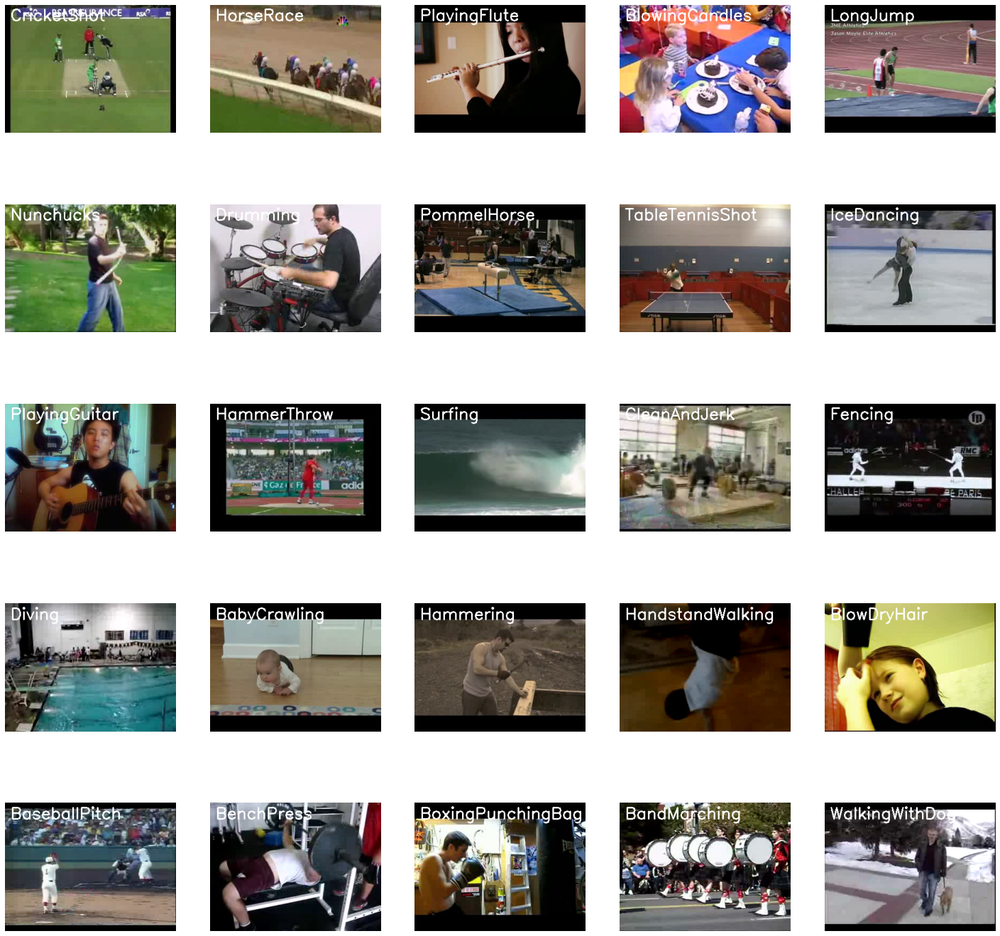

In [ ]:
# Create a Matplotlib figure and specify the size of the figure.
plt.figure(figsize = (25, 25))

# Get the names of all classes/categories in UCF101.
allClassesNames = os.listdir('UCF-101')

# Generate a list of 25 random values. The values will be between 0-101, where 101 is the total number of class in the dataset.
randomRange = random.sample(range(len(allClassesNames)), 25)

# Iterating through all the generated random values.
for counter, randomIndex in enumerate(randomRange, 1):

    # Retrieve a Class Name using the Random Index.
    selectedClassName = allClassesNames[randomIndex]

    # Retrieve the list of all the video files present in the randomly selected Class Directory.
    videoFilesNamesList = os.listdir(f'UCF-101/{selectedClassName}')

    # Randomly select a video file from the list retrieved from the randomly selected Class Directory.
    selectedVideoFileName = random.choice(videoFilesNamesList)

    # Initialize a VideoCapture object to read from the video File.
    videoReader = cv2.VideoCapture(f'UCF-101/{selectedClassName}/{selectedVideoFileName}')

    # Read the first frame of the video file.
    _, bgrFrame = videoReader.read()

    # Release the VideoCapture object.
    videoReader.release()

    # Convert the frame from BGR into RGB format. Open CV default color scheme: BGR
    rgbFrame = cv2.cvtColor(bgrFrame, cv2.COLOR_BGR2RGB)

    # Write the class name on the video frame.
    cv2.putText(rgbFrame, selectedClassName, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Display the frame.
    plt.subplot(5, 5, counter)
    plt.imshow(rgbFrame)
    plt.axis('off')

**Data Preprocessing**

**Initialization of some variables**

In [ ]:
# Specify the height and width to which each video frame will be resized in our dataset.
image_height , image_width = 64, 64

# Specify the number of frames of a video that will be fed to the model as one sequence.Since the LSTM works upon the sequential dataset
sequence_length = 25

# Specify the directory containing the UCF101 dataset.
dataset_directory = "UCF-101"

# Specify the list containing the names of the classes used for training.
#classes_list = ["ApplyEyeMakeup", "ApplyLipstick", "Archery", "BabyCrawling", "BalanceBeam", "BandMarching", "BaseballPitch", "Basketball", "BasketballDunk", "BenchPress", "Biking", "Billiards", "BlowDryHair", "BlowingCandles", "BodyWeightSquats", "Bowling", "BoxingPunchingBag", "BoxingSpeedBag", "BreastStroke", "BrushingTeeth","CliffDiving", "CricketBowling", "CricketShot", "CuttingInKitchen", "Diving", "Drumming", "Fencing", "FieldHockeyPenalty", "FloorGymnastics", "FrisbeeCatch", "FrontCrawl", "GolfSwing", "Haircut", "HammerThrow", "Hammering", "HandstandPushups", "HandstandWalking", "HeadMassage", "HighJump", "HorseRace", "HorseRiding", "HulaHoop", "IceDancing", "JavelinThrow", "JugglingBalls", "JumpRope", "JumpingJack", "Kayaking", "Knitting", "LongJump", "Lunges", "MilitaryParade", "Mixing", "MoppingFloor", "Nunchucks", "ParallelBars", "PizzaTossing", "PlayingGuitar", "PlayingPiano", "PlayingTabla", "PlayingViolin", "PlayingCello", "PlayingDaf", "PlayingDhol", "PlayingFlute", "PlayingSitar", "PoleVault", "PommelHorse", "PullUps", "Punch", "PushUps", "Rafting", "RockClimbingIndoor", "RopeClimbing", "Rowing", "SalsaSpins", "ShavingBeard", "Shotput", "SkateBoarding", "Skiing", "Skijet", "SkyDiving", "SoccerJuggling", "SoccerPenalty", "StillRings", "SumoWrestling", "Surfing", "Swing", "TableTennisShot", "TaiChi", "TennisSwing", "ThrowDiscus", "TrampolineJumping", "Typing", "UnevenBars", "VolleyballSpiking", "WalkingWithDog", "WallPushups", "WritingOnBoard", "YoYo"]
classes_list = ["ApplyLipstick","BabyCrawling","MilitaryParade","PlayingGuitar","CricketBowling"]

**Function to extract, resize and normalise frames**

In [ ]:
def framesExtraction(video_path):

    # Declare a list to store video frames.
    framesList = []

    # Read the Video File using the VideoCapture object.
    videoReader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    videoFramesCount = int(videoReader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the the interval after which frames will be added to the list.
    skipFramesWindow = max(int(videoFramesCount/sequence_length), 1)

    # Iterate through the Video Frames.
    for frameCounter in range(sequence_length):

        # Set the current frame position of the video.
        videoReader.set(cv2.CAP_PROP_POS_FRAMES, frameCounter * skipFramesWindow)

        # Reading the frame from the video.
        success, frame = videoReader.read()

        # Check if Video frame is not successfully read then break the loop
        if not success:
            break

        # Resize the Frame to fixed height and width.
        resizedFrame = cv2.resize(frame, (image_height, image_width))

        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalizedFrame = resizedFrame / 255

        # Append the normalized frame into the frames list
        framesList.append(normalizedFrame)

    # Release the VideoCapture object.
    videoReader.release()

    # Return the frames list.
    return framesList

**Function to create dataset**

In [ ]:
def createDataset():

    # Declared Empty Lists to store the features, labels and video file path values.
    features = []
    labels = []
    videoFilesPaths = []

    # Iterating through all the classes mentioned in the classes list
    for classIndex, className in enumerate(classes_list):

        # Display the name of the class whose data is being extracted.
        print(f'Extracting Data of Class: {className}')

        # Get the list of video files present in the specific class name directory.
        filesList = os.listdir(os.path.join(dataset_directory, className))

        # Iterate through all the files present in the files list.
        for fileName in filesList:

            # Get the complete video path.
            videoFilePath = os.path.join(dataset_directory, className, fileName)

            # Extract the frames of the video file.
            frames = framesExtraction(videoFilePath)

            # Check if the extracted frames are equal to the sequence_length specified above.
            # So ignore the vides having frames less than the sequence_length.
            if len(frames) == sequence_length:

                # Append the data to their repective lists.
                features.append(frames)
                labels.append(classIndex)
                videoFilesPaths.append(videoFilePath)

    # Converting the list to numpy arrays
    features = np.asarray(features)
    labels = np.array(labels)

    # Return the frames, class index, and video file path.
    return features, labels, videoFilesPaths

In [ ]:
# Create the dataset.
features, labels, videoFilesPaths = createDataset()

Extracting Data of Class: ApplyLipstick
Extracting Data of Class: BabyCrawling
Extracting Data of Class: MilitaryParade
Extracting Data of Class: PlayingGuitar
Extracting Data of Class: CricketBowling


**One-hot encoding**

In [ ]:
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
oneHotEncodedLabels = to_categorical(labels)

**Spliting the dataset into train and test data**

In [ ]:
# Split the Data into Train ( 75% ) and Test Set ( 25% ).
featuresTrain, featuresTest, labelsTrain, labelsTest = train_test_split(features, oneHotEncodedLabels,
                                                                            test_size = 0.25, shuffle = True,
                                                                            random_state = seedConstant)

**Constructing,Compiling and Training the model**

**Creating the function to construct the model**

In [ ]:
def createLRCNModel():

    # We will use a Sequential model for model construction.
    model = Sequential()

    # Define the Model Architecture.
    ########################################################################################################################

    model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same',activation = 'relu'),input_shape = (sequence_length, image_height, image_width, 3)))
    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    #model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Flatten()))
    model.add(LSTM(32))

    model.add(Dense(len(classes_list), activation = 'softmax'))

    ########################################################################################################################

    # Display the models summary.
    model.summary()

    # Return the constructed LRCN model.
    return model

**Utilize the function** createLRCNModel() **created above to construct the required `LRCN` model.**

In [ ]:
# Construct the required LRCN model.
LRCNModel = createLRCNModel()

# Display the success message.
print("Model Created Successfully!")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, 25, 64, 64, 16)   448       
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, 25, 16, 16, 16)   0         
 tributed)                                                       
                                                                 
 time_distributed_2 (TimeDis  (None, 25, 16, 16, 16)   0         
 tributed)                                                       
                                                                 
 time_distributed_3 (TimeDis  (None, 25, 16, 16, 32)   4640      
 tributed)                                                       
                                                                 
 time_distributed_4 (TimeDis  (None, 25, 4, 4, 32)     0

**Plotting the model structure**

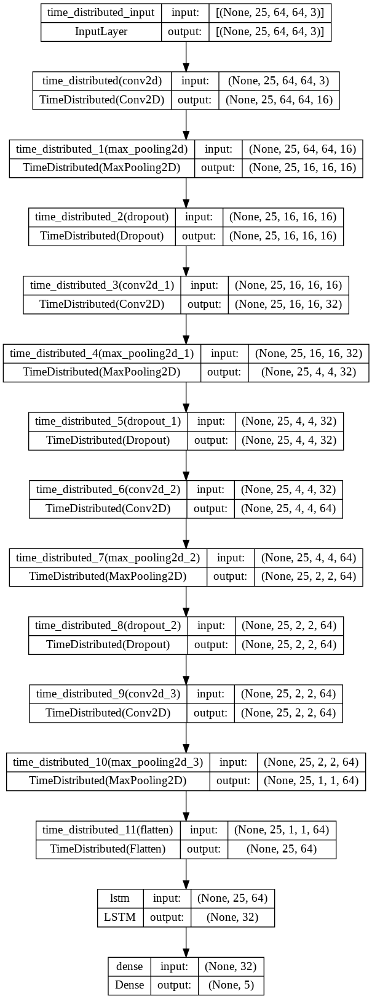

In [ ]:
# Plot the structure of the contructed LRCN model.
plot_model(LRCNModel, to_file = 'LRCNModelStructurePlot.png', show_shapes = True, show_layer_names = True)

**Compiling & Training the model**

In [ ]:
# Create an Instance of Early Stopping Callback.
earlyStoppingCallback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)

# Compile the model and specify loss function, optimizer and metrics to the model.
LRCNModel.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

# Start training the model.
LRCNModelTrainingHistory = LRCNModel.fit(x = featuresTrain, y = labelsTrain, epochs = 30, batch_size = 4 ,shuffle = True, validation_split = 0.25, callbacks = [earlyStoppingCallback])

Epoch 1/30
94/94 [==============================] - 26s 248ms/step - loss: 1.6130 - accuracy: 0.2101 - val_loss: 1.6014 - val_accuracy: 0.2143
Epoch 2/30
94/94 [==============================] - 22s 238ms/step - loss: 1.5486 - accuracy: 0.3005 - val_loss: 1.3724 - val_accuracy: 0.4921
Epoch 3/30
94/94 [==============================] - 24s 256ms/step - loss: 1.2197 - accuracy: 0.4388 - val_loss: 1.0919 - val_accuracy: 0.5079
Epoch 4/30
94/94 [==============================] - 22s 236ms/step - loss: 0.9580 - accuracy: 0.6170 - val_loss: 0.8905 - val_accuracy: 0.6270
Epoch 5/30
94/94 [==============================] - 23s 250ms/step - loss: 0.9005 - accuracy: 0.6729 - val_loss: 0.8791 - val_accuracy: 0.5635
Epoch 6/30
94/94 [==============================] - 22s 239ms/step - loss: 0.6299 - accuracy: 0.7713 - val_loss: 0.6596 - val_accuracy: 0.7937
Epoch 7/30
94/94 [==============================] - 22s 238ms/step - loss: 0.7268 - accuracy: 0.7287 - val_loss: 0.7073 - val_accuracy: 0.7381

**Evaluating the trained Model**

In [ ]:
# Evaluate the trained model.
modelEvaluationHistory = LRCNModel.evaluate(featuresTest, labelsTest)

6/6 [==============================] - 3s 475ms/step - loss: 0.3872 - accuracy: 0.9048


**Saving the model**

In [ ]:
# Define the string date format.
# Get the current Date and Time in a DateTime Object.
# Convert the DateTime object to string according to the style mentioned in date_time_format string.
dateTimeFormat = '%Y_%m_%d__%H_%M_%S'
currentDateTimeDt = dt.datetime.now()
currentDateTimeString = dt.datetime.strftime(currentDateTimeDt, dateTimeFormat)

# Get the loss and accuracy from modelEvaluationHistory.
modelEvaluationLoss, modelEvaluationAccuracy = modelEvaluationHistory

# Define a useful name for our model to make it easy for us while navigating through multiple saved models.
modelFileName = f'LRCN_model___Date_Time_{currentDateTimeString}___Loss_{modelEvaluationLoss}___Accuracy_{modelEvaluationAccuracy}.h5'

# Save the Model.
LRCNModel.save(modelFileName)

**Defining the function to plot the accuracy and loss graphs**

In [ ]:
def plotMetric(modelTrainingHistory, metricName_1, metricName_2, plotName):

    # Get metric values using metric names as identifiers.
    metricValue_1 = modelTrainingHistory.history[metricName_1]
    metricValue_2 = modelTrainingHistory.history[metricName_2]

    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metricValue_1))

    # Plot the Graph.
    plt.plot(epochs, metricValue_1, 'green', label = metricName_1)
    plt.plot(epochs, metricValue_2, 'red', label = metricName_2)

    # Add title to the plot.
    plt.title(str(plotName))

    # Add legend to the plot.
    plt.legend()

**Plotting the Accuracy and Loss Graphs**

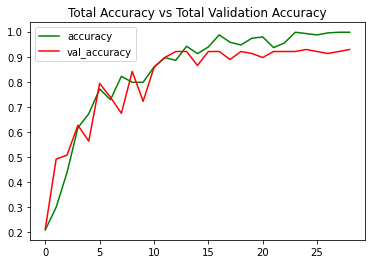

In [ ]:
# Visualize the training and validation accuracy metrices.
plotMetric(LRCNModelTrainingHistory, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

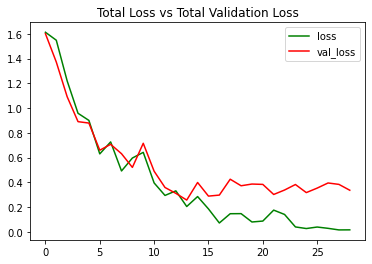

In [ ]:
# Visualize the training and validation loss metrices.
plotMetric(LRCNModelTrainingHistory, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

**Prediction of Model**

**Function to download youtube videos**

In [ ]:
def downloadYoutubeVideos(youtubeVideourl, outputDirectory):

     # Create a video object which contains useful information about the video.
     video = pafy.new(youtubeVideourl)

     # Retrieve the title of the video.
     title = video.title

     # Get the best available quality object for the video.
     bestVideo = video.getbest()

     # Construct the output file path.
     outputFilePath = f'{outputDirectory}/{title}.mp4'

     # Download the youtube video at the best available quality and store it to the contructed path.
     bestVideo.download(filepath = outputFilePath, quiet = True)

     # Return the video title.
     return title

**Download the test Video**

In [ ]:
# Make the Output directory if it does not exist
testVideosDirectory = 'test_videos'
os.makedirs(testVideosDirectory, exist_ok = True)

# Download a YouTube Video.
videoTitle = downloadYoutubeVideos('https://www.youtube.com/watch?v=sSKM8XyZC14', testVideosDirectory)

# Get the YouTube Video's path we just downloaded.
inputVideoFilePath = f'{testVideosDirectory}/{videoTitle}.mp4'

**Function to recognise the activity on video**

In [ ]:
def predictOnVideo(videoFilePath, outputFilePath, sequence_length):

    # Initialize the VideoCapture object to read from the video file.
    videoReader = cv2.VideoCapture(videoFilePath)

    # Get the height and width of the video.
    originalVideoHeight = int(videoReader.get(cv2.CAP_PROP_FRAME_HEIGHT))
    originalVideoWidth = int(videoReader.get(cv2.CAP_PROP_FRAME_WIDTH))


    # Initialize the VideoWriter Object to store the output video in the disk.
    videoWriter = cv2.VideoWriter(outputFilePath, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'),
                                   videoReader.get(cv2.CAP_PROP_FPS), (originalVideoWidth, originalVideoHeight))


    # Initialize a variable to store the predicted action being performed in the video.
    predictedClassName = ''

    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = sequence_length)

    # Iterate until the video is accessed successfully.
    while videoReader.isOpened():

        # Read the frame.
        ok, frame = videoReader.read()

        # Check if frame is not read properly then break the loop.
        if not ok:
            break

        # Resize the Frame to fixed Dimensions.
        resizedFrame = cv2.resize(frame, (image_height , image_width))

        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalizedFrame = resizedFrame / 255

        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalizedFrame)

        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == sequence_length:

            # Pass the normalized frames to the model and get the predicted probabilities.
            predictedLabelsProbabilities = LRCNModel.predict(np.expand_dims(frames_queue, axis = 0))[0]

            # Get the index of class with highest probability.
            predictedLabel = np.argmax(predictedLabelsProbabilities)

            # Get the class name using the retrieved index.
            predictedClassName = classes_list[predictedLabel]

        # Write predicted class name on top of the frame.
        cv2.putText(frame, predictedClassName, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

        # Write The frame into the disk using the VideoWriter Object.
        videoWriter.write(frame)

    # Release the VideoCapture and VideoWriter objects.
    videoReader.release()
    videoWriter.release()

**Perform Actions Recognition on the Test Video**

In [ ]:
# Construct the output video path.
outputVideoFilePath = f'{testVideosDirectory}/{videoTitle}-Output-SeqLen{sequence_length}.mp4'

# Perform Action Recognition on the Test Video.
predictOnVideo(inputVideoFilePath, outputVideoFilePath, sequence_length)

# Display the output video.
VideoFileClip(outputVideoFilePath, audio=False, target_resolution=(300,None)).ipython_display()

1/1 [==============================] - 0s 42ms/step


100%|██████████| 883/883 [00:05<00:00, 155.61it/s]


**Function to Perform single action recognition on the test video**

In [ ]:
def predictSingleAction(videoFilePath, sequence_length):

    # Initialize the VideoCapture object to read from the video file.
    videoReader = cv2.VideoCapture(videoFilePath)

    # Get the width and height of the video.
    originalVideoWidth = int(videoReader.get(cv2.CAP_PROP_FRAME_WIDTH))
    originalVideoHeight = int(videoReader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Declare a list to store video frames we will extract.
    framesList = []

    # Initialize a variable to store the predicted action being performed in the video.
    predictedClassName = ''

    # Get the number of frames in the video.
    videoFramesCount = int(videoReader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval after which frames will be added to the list.
    skipFramesWindow = max(int(videoFramesCount/sequence_length),1)

    # Iterating the number of times equal to the fixed length of sequence.
    for frameCounter in range(sequence_length):

        # Set the current frame position of the video.
        videoReader.set(cv2.CAP_PROP_POS_FRAMES, frameCounter * skipFramesWindow)

        # Read a frame.
        success, frame = videoReader.read()

        # Check if frame is not read properly then break the loop.
        if not success:
            break

        # Resize the Frame to fixed Dimensions.
        resizedFrame = cv2.resize(frame, (image_height,image_width))

        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1.
        normalizedFrame = resizedFrame / 255

        # Appending the pre-processed frame into the frames list
        framesList.append(normalizedFrame)

    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predictedLabelsProbabilities = LRCNModel.predict(np.expand_dims(framesList, axis = 0))[0]

    # Get the index of class with highest probability.
    predictedLabel = np.argmax(predictedLabelsProbabilities)

    # Get the class name using the retrieved index.
    predictedClassName = classes_list[predictedLabel]

    # Display the predicted action along with the prediction confidence.
    print(f'Action Predicted: {predictedClassName}\nConfidence: {predictedLabelsProbabilities[predictedLabel]}')

    # Release the VideoCapture object.
    videoReader.release()

**Perform single Action Recognition on the Test Video**

In [ ]:
# Download the youtube video.
videoTitle = downloadYoutubeVideos('https://www.youtube.com/watch?v=UoWRe6Ny8CQ', testVideosDirectory)

# Construct the input youtube video path
inputVideoFilePath = f'{testVideosDirectory}/{videoTitle}.mp4'

# Perform Single Prediction on the Test Video.
predictSingleAction(inputVideoFilePath, sequence_length)

# Display the input video.
VideoFileClip(inputVideoFilePath, audio=False, target_resolution=(300,None)).ipython_display()


1/1 [==============================] - 0s 39ms/step
Action Predicted: BabyCrawling
Confidence: 0.9008606672286987


100%|█████████▉| 743/744 [00:02<00:00, 288.68it/s]
